In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv(r"C:\Users\premc\Downloads\dataset.csv")

In [3]:
df.shape

(112634, 17)

In [4]:
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [5]:
df.columns=df.columns.str.lower().str.replace(' ','')

In [6]:
df.rename(columns={'county':'country'},inplace=True)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   vin(1-10)                                     112634 non-null  object 
 1   country                                       112634 non-null  object 
 2   city                                          112634 non-null  object 
 3   state                                         112634 non-null  object 
 4   postalcode                                    112634 non-null  int64  
 5   modelyear                                     112634 non-null  int64  
 6   make                                          112634 non-null  object 
 7   model                                         112614 non-null  object 
 8   electricvehicletype                           112634 non-null  object 
 9   cleanalternativefuelvehicle(cafv)eligibility  11

In [8]:
df.head()

,vin(1-10),country,city,state,postalcode,modelyear,make,model,electricvehicletype,cleanalternativefuelvehicle(cafv)eligibility,electricrange,basemsrp,legislativedistrict,dolvehicleid,vehiclelocation,electricutility,2020censustract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [9]:
df.isnull().sum()

vin(1-10)                                         0
country                                           0
city                                              0
state                                             0
postalcode                                        0
modelyear                                         0
make                                              0
model                                            20
electricvehicletype                               0
cleanalternativefuelvehicle(cafv)eligibility      0
electricrange                                     0
basemsrp                                          0
legislativedistrict                             286
dolvehicleid                                      0
vehiclelocation                                  24
electricutility                                 443
2020censustract                                   0
dtype: int64

In [10]:
## Removing missing values
df.dropna(inplace=True)
df.reset_index(drop=True,inplace=True)
print("Missing values count:")
print(df.isnull().sum().sort_values(ascending=False))

Missing values count:
vin(1-10)                                       0
cleanalternativefuelvehicle(cafv)eligibility    0
electricutility                                 0
vehiclelocation                                 0
dolvehicleid                                    0
legislativedistrict                             0
basemsrp                                        0
electricrange                                   0
electricvehicletype                             0
country                                         0
model                                           0
make                                            0
modelyear                                       0
postalcode                                      0
state                                           0
city                                            0
2020censustract                                 0
dtype: int64


In [11]:
df.shape

(112152, 17)

In [12]:
count={}
for col in df.columns:
    count[col]=df[col].nunique()
for i,element in count.items():
    print(f"{i}:{element}")

vin(1-10):7522
country:39
city:435
state:1
postalcode:516
modelyear:20
make:34
model:114
electricvehicletype:2
cleanalternativefuelvehicle(cafv)eligibility:3
electricrange:101
basemsrp:30
legislativedistrict:49
dolvehicleid:112152
vehiclelocation:516
electricutility:73
2020censustract:1760


In [13]:
numerical_columns = df.select_dtypes(include=['number']).columns
print(numerical_columns)

Index(['postalcode', 'modelyear', 'electricrange', 'basemsrp',
       'legislativedistrict', 'dolvehicleid', '2020censustract'],
      dtype='object')


In [14]:
categorical_columns = df.select_dtypes(exclude=['number']).columns
print(categorical_columns)

Index(['vin(1-10)', 'country', 'city', 'state', 'make', 'model',
       'electricvehicletype', 'cleanalternativefuelvehicle(cafv)eligibility',
       'vehiclelocation', 'electricutility'],
      dtype='object')


### UNI-VARIATE ANALYSIS

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a

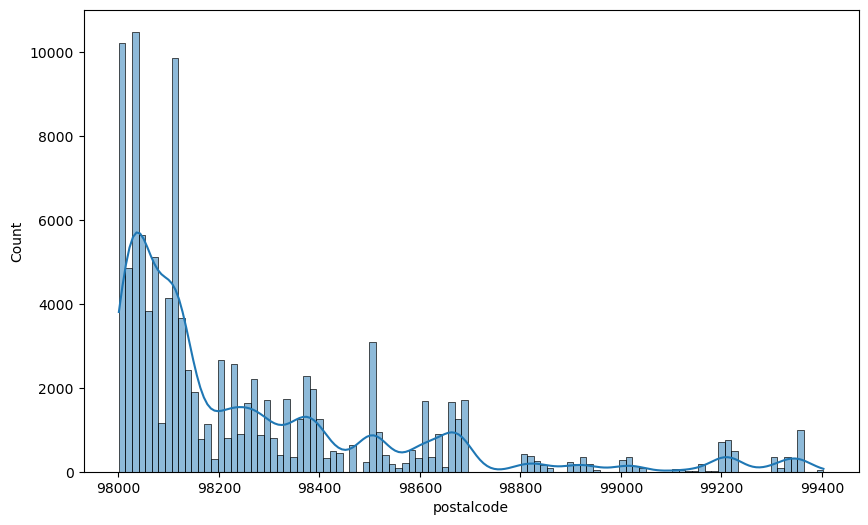

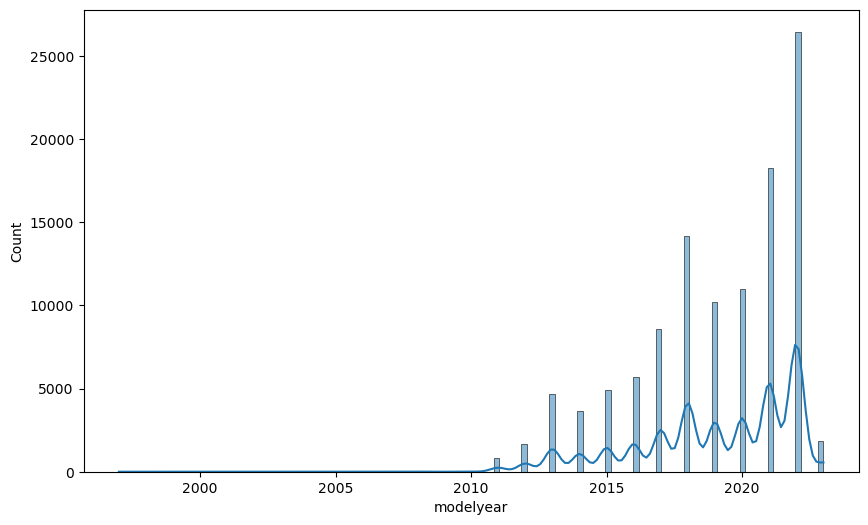

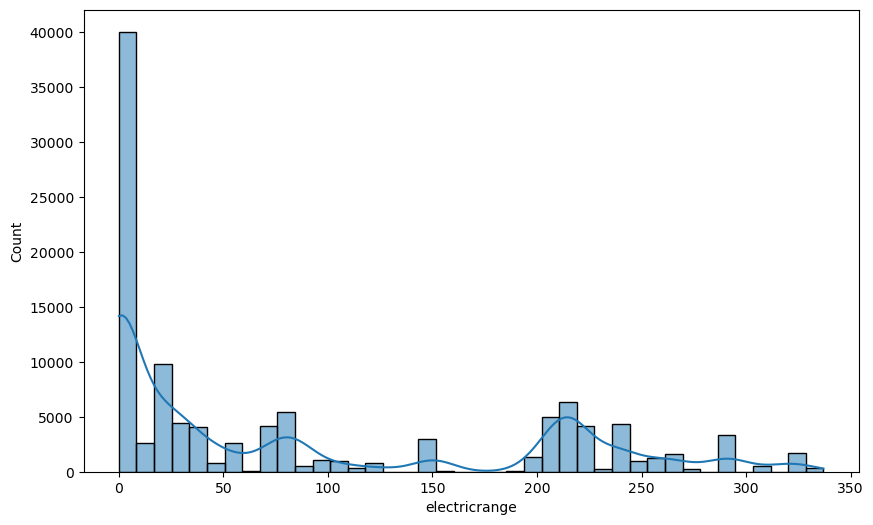

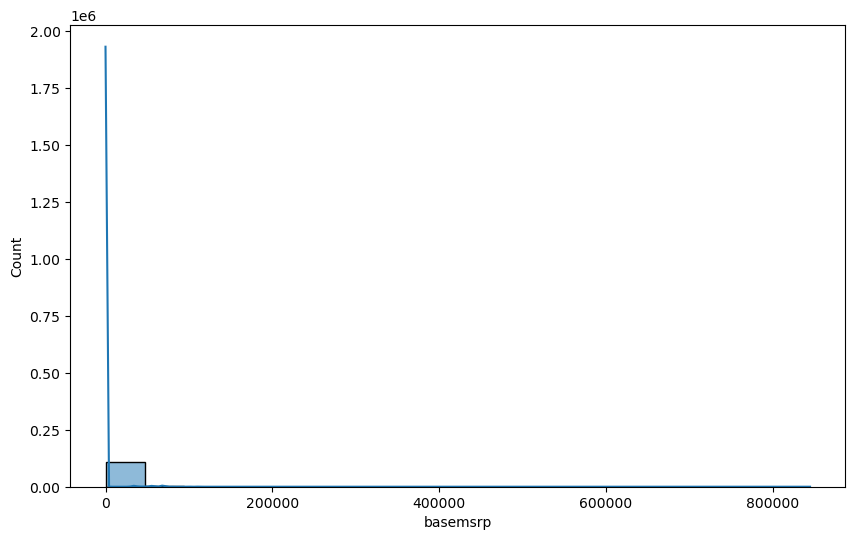

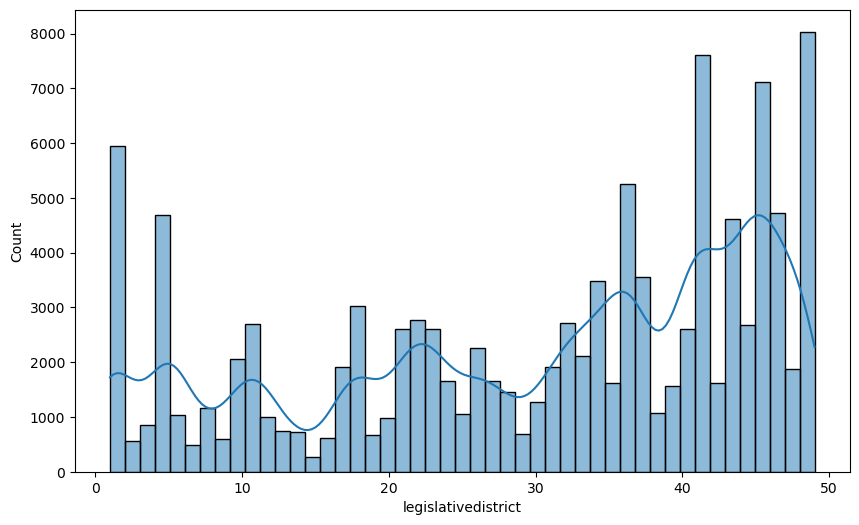

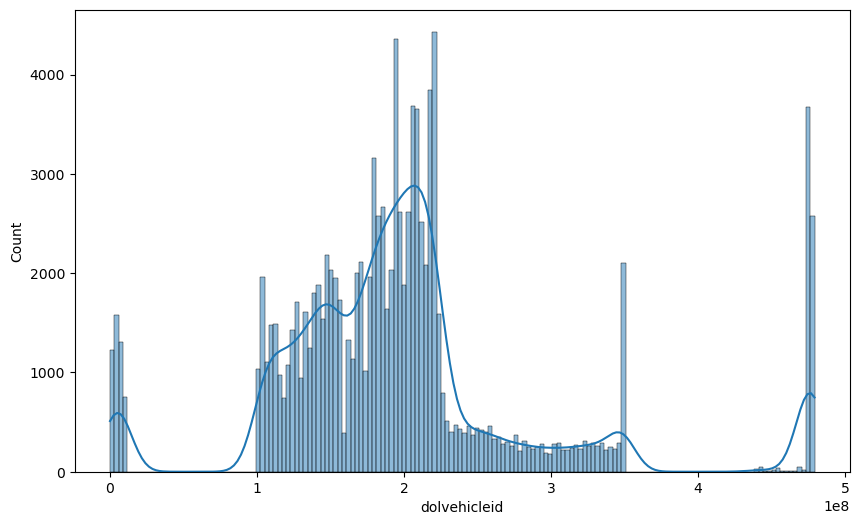

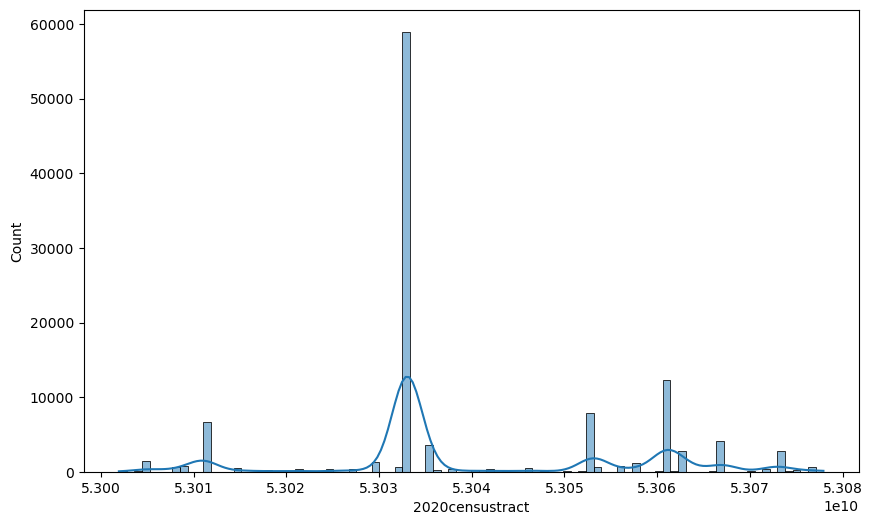

In [49]:
def plot_hist(df, columns):
    for col in columns:
        iqr = q3 - q1
        lower_bound = q1 - (1.5 * iqr)
        upper_bound = q3 + (1.5 * iqr)
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        plt.figure(figsize=(10,6))
        sns.histplot(df[col],kde=True)
plot_hist(df, numerical_columns)


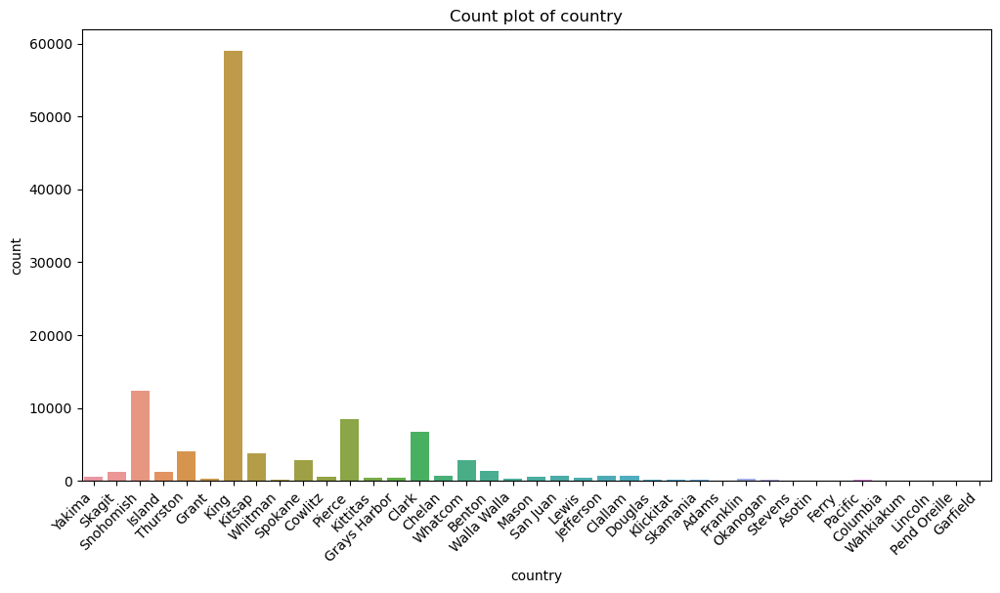

- There are 39 unique categories.




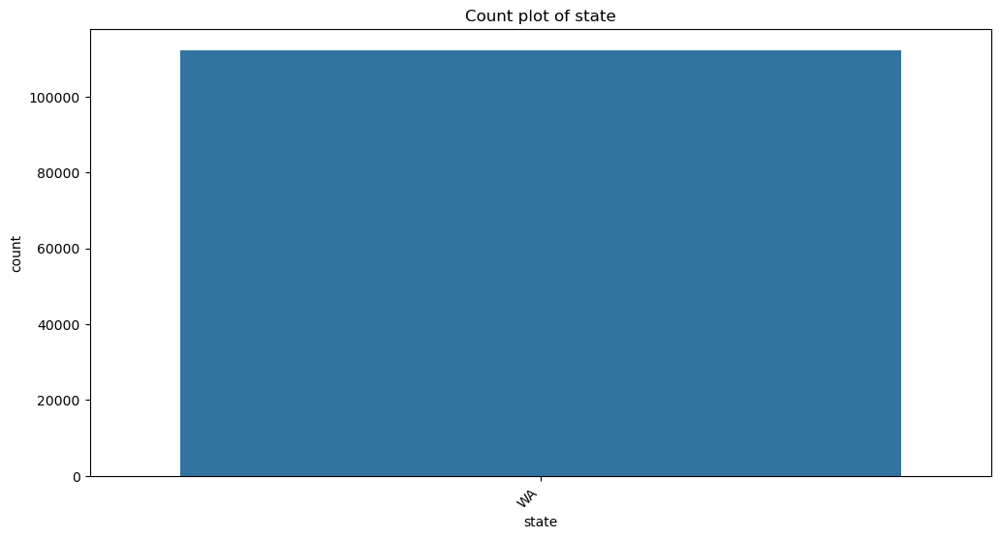

- There are 1 unique categories.




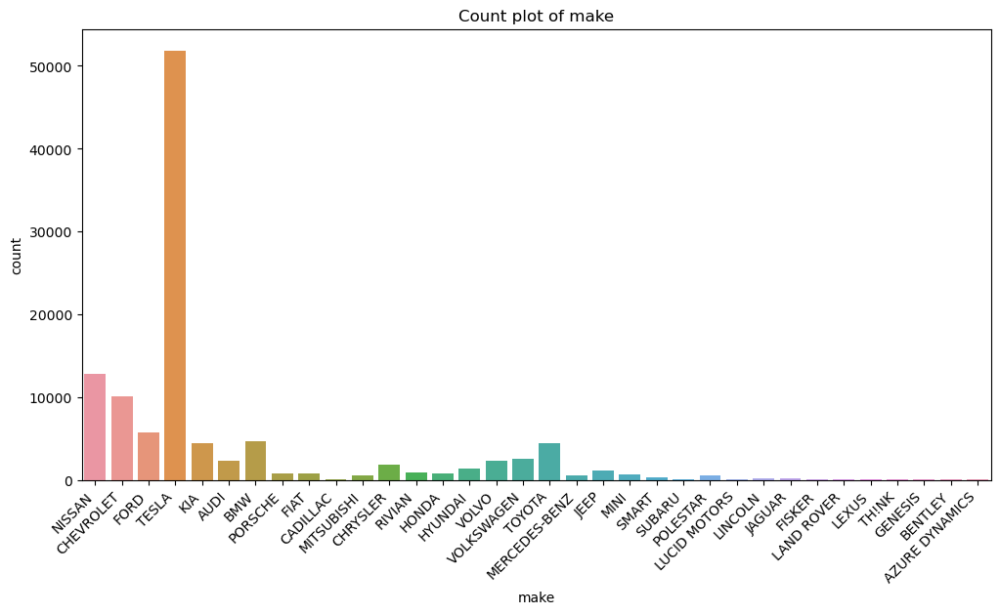

- There are 34 unique categories.




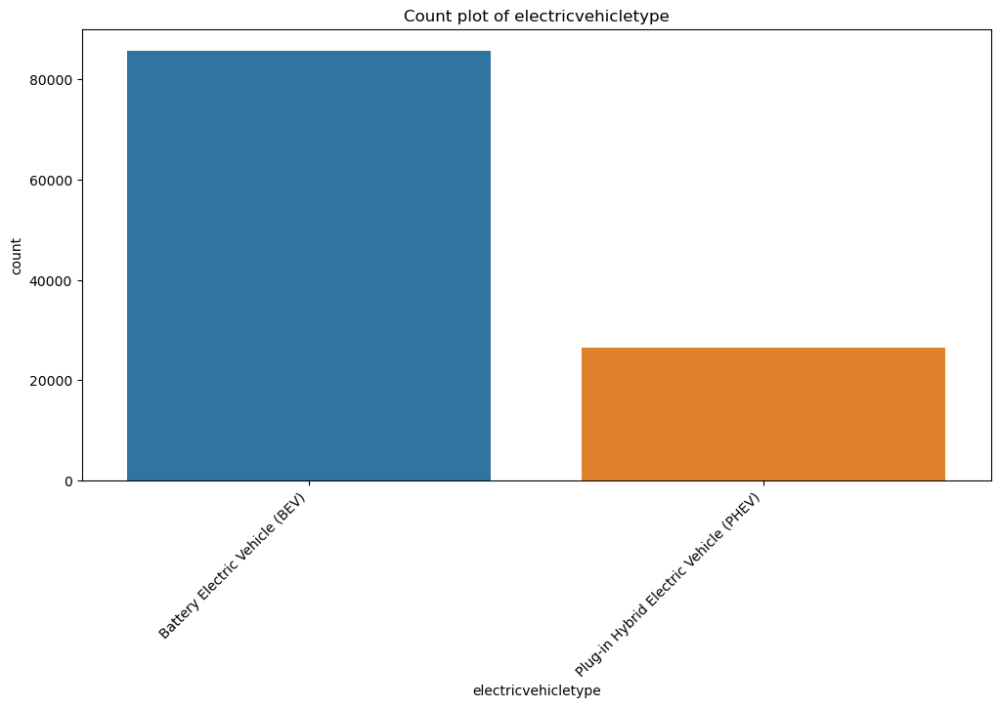

- There are 2 unique categories.




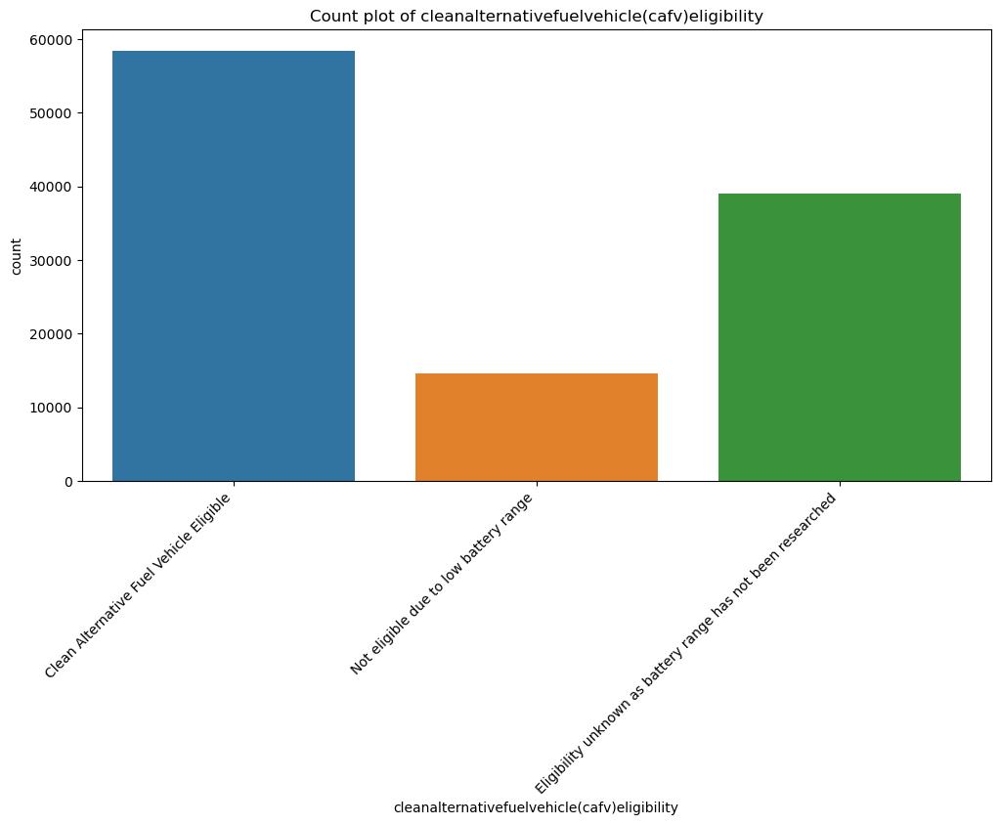

- There are 3 unique categories.




In [50]:
# Function to plot count plots for categorical columns
def plot_countplots(df, columns):
    for col in columns:
        if df[col].nunique()<=50:
            plt.figure(figsize=(12, 6))
            sns.countplot(x=col, data=df)
            plt.title(f'Count plot of {col}')
            plt.xticks(rotation=45, ha='right')
            plt.show()
            print(f"- There are {df[col].nunique()} unique categories.")
            print("\n")
        
# Plot count plots for categorical columns
plot_countplots(df, categorical_columns)


In [51]:
# Find outliers in numerical columns
for col in numerical_columns:
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    print(f"Number of outliers in {col}: {len(outliers)}")
    print("\n")

Number of outliers in postalcode: 6514


Number of outliers in modelyear: 40


Number of outliers in electricrange: 0


Number of outliers in basemsrp: 3498


Number of outliers in legislativedistrict: 0


Number of outliers in dolvehicleid: 15483


Number of outliers in 2020censustract: 34




### BI-VARIATE ANALYSIS

In [53]:
def plot_scatter(df, x_col, y_col):
    fig, ax = plt.subplots(figsize=(12, 8))
    fig.suptitle(f'Relationship between {x_col} and {y_col}', fontsize=16)
    sns.scatterplot(data=df, x=x_col, y=y_col, ax=ax)
    ax.set_title('Scatter Plot')
    plt.show()
    correlation = df[x_col].corr(df[y_col])

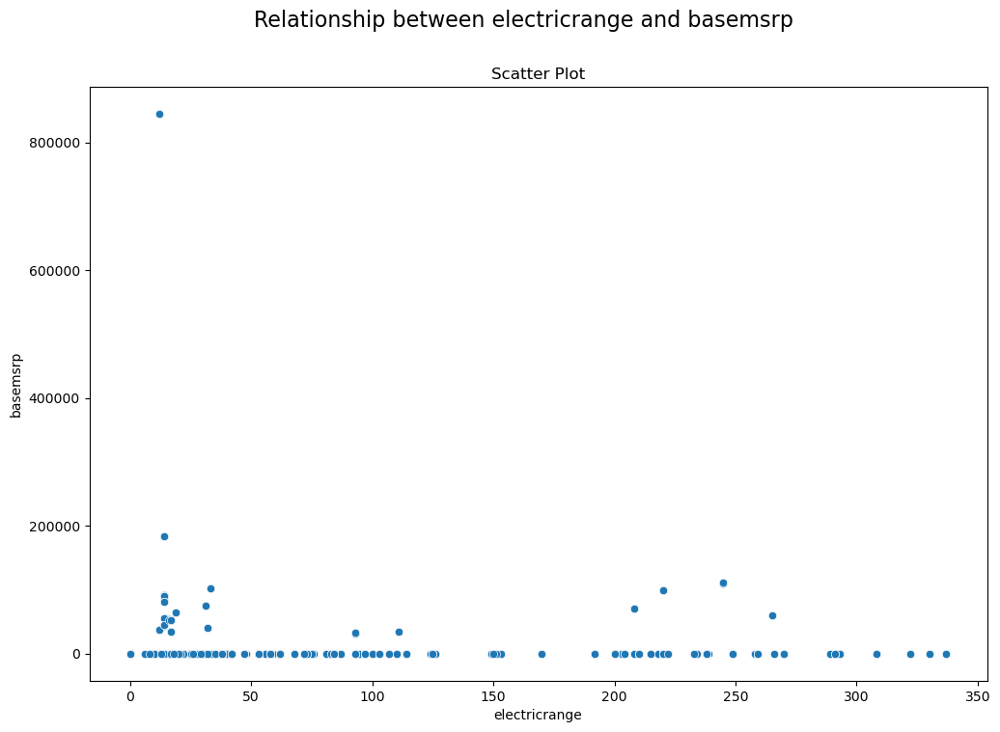

In [54]:
plot_scatter(df,'electricrange','basemsrp')

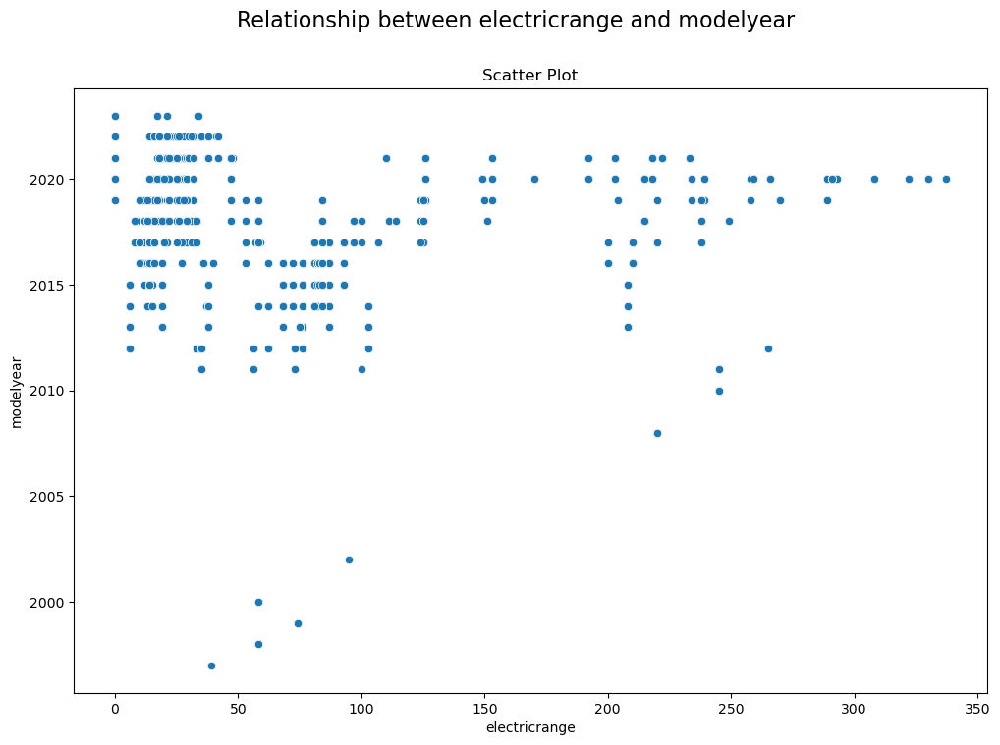

In [55]:
plot_scatter(df,'electricrange','modelyear')

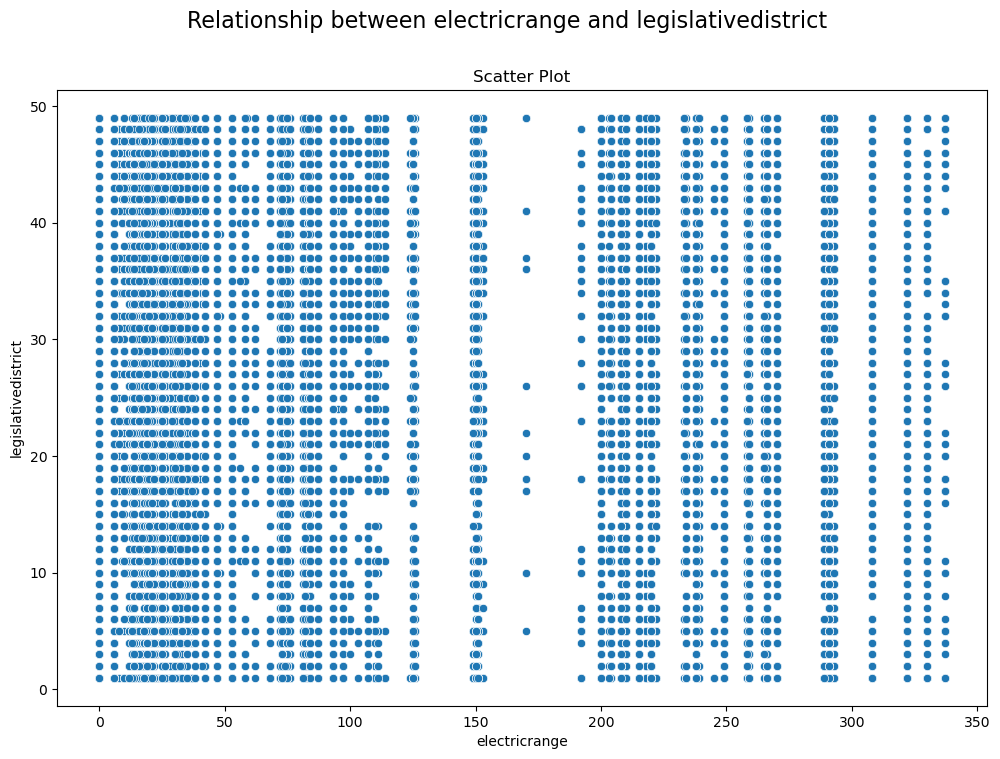

In [56]:
plot_scatter(df,'electricrange','legislativedistrict')

In [22]:
# Function to plot stacked bar plots for categorical-categorical relationships
def plot_stacked_bar(df, cat_col1, cat_col2):
    contingency_table = pd.crosstab(df[cat_col1], df[cat_col2], normalize='index')
    contingency_table.plot(kind='bar', stacked=True, figsize=(12, 6))
    plt.title(f'Stacked Bar plot of {cat_col1} vs {cat_col2}')
    plt.xlabel(cat_col1)
    plt.ylabel('Proportion')
    plt.legend(title=cat_col2, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    print(f"Observations for stacked bar plot of {cat_col1} vs {cat_col2}:")
    print(f"- Each bar represents the proportion of categories in {cat_col2} for each category in {cat_col1}.")
    print("- The full height of each bar is 100%.")
    print("\n")


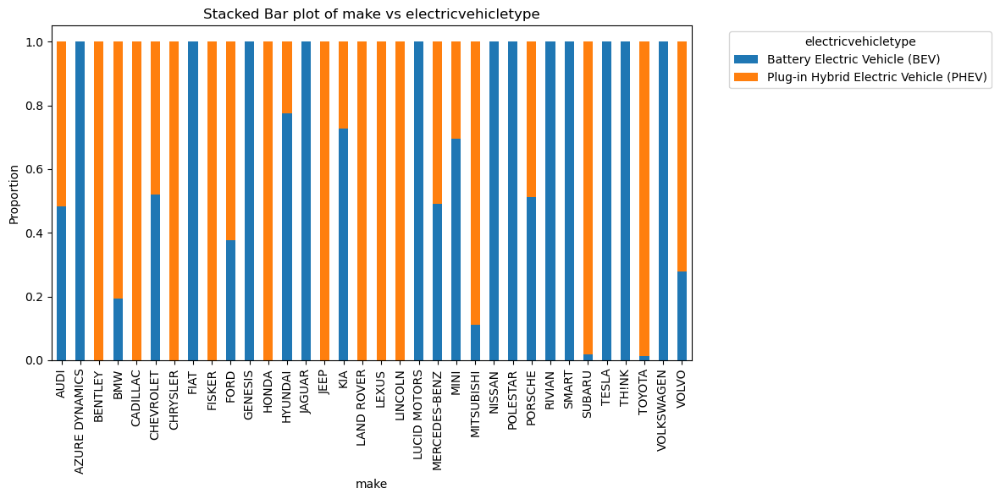

Observations for stacked bar plot of make vs electricvehicletype:
- Each bar represents the proportion of categories in electricvehicletype for each category in make.
- The full height of each bar is 100%.




In [23]:
plot_stacked_bar(df, 'make', 'electricvehicletype')

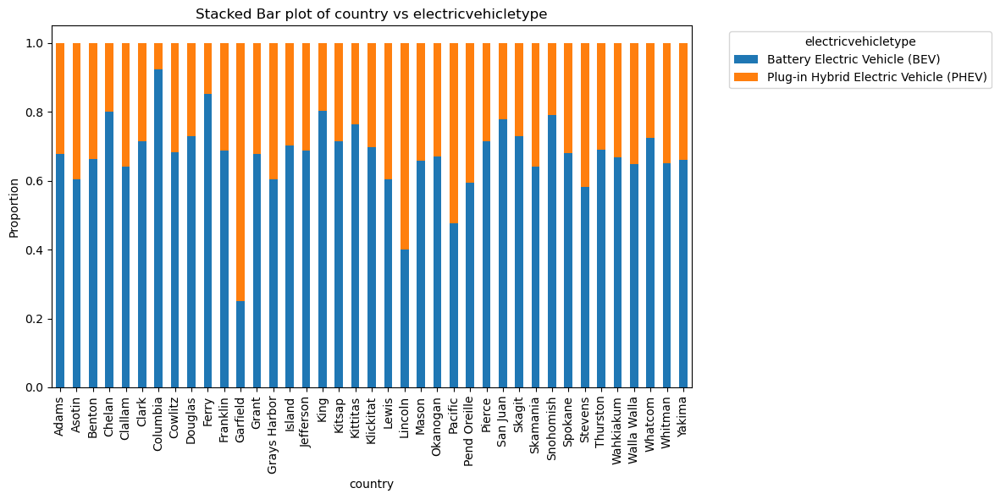

Observations for stacked bar plot of country vs electricvehicletype:
- Each bar represents the proportion of categories in electricvehicletype for each category in country.
- The full height of each bar is 100%.




In [24]:
plot_stacked_bar(df, 'country', 'electricvehicletype')

In [28]:
import plotly.express as px
import bar_chart_race as bcr

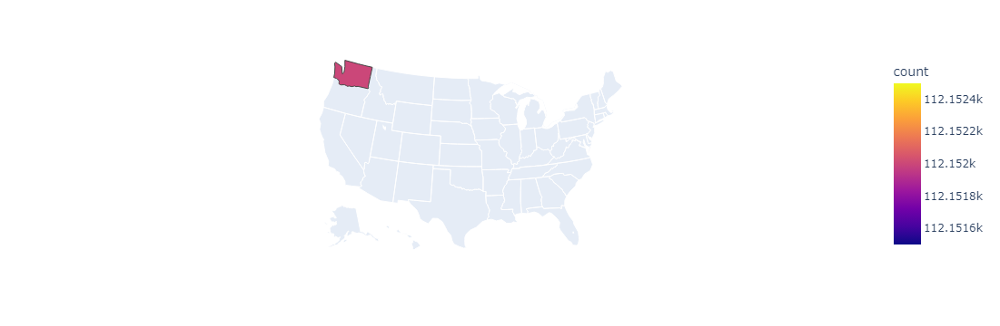

In [29]:
temp = df.groupby('state').size().reset_index(name='count')
fig = px.choropleth(temp,
                    locations='state',
                    color='count',
                    hover_name='count',
                    locationmode="USA-states",
                    scope="usa",
                  )
fig.show()

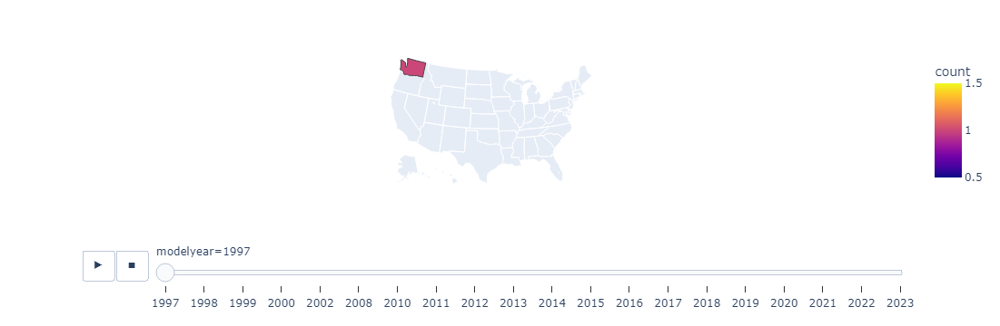

In [30]:
temp1 = df.groupby(['state', 'modelyear']).size().reset_index(name='count')
fig = px.choropleth(temp1,
                    locations='state',
                    color='count',
                    hover_name='count',
                    locationmode="USA-states",
                    scope="usa",
                    animation_frame='modelyear'
                  )
fig.show()

In [31]:
data= df.groupby(['modelyear', 'make']).size().reset_index(name='count')
data.head()

,modelyear,make,count
0,1997,CHEVROLET,1
1,1998,FORD,1
2,1999,FORD,3
3,2000,FORD,10
4,2002,TOYOTA,2


In [32]:
import networkx as nx
from matplotlib.animation import FuncAnimation, PillowWriter 

In [33]:
bcr.bar_chart_race(
    df=data.pivot_table(index='modelyear', columns='make', values='count', fill_value=0),
    filename='EV_Racing_Bar_Plot.gif',
    orientation='h',  
    sort='desc',  
    n_bars=10,  
    steps_per_period=45,  
    period_length=3000,  
    title='Year-wise Sales of Each Electric Vehicle Maker',
    period_label={'x': .95, 'y': .15, 'ha': 'right', 'va': 'center', 'size': 50, 'weight': 'semibold'},
    filter_column_colors=True,
    bar_kwargs={'alpha': .99, 'lw': 0}
)

C:\Users\premc\AppData\Roaming\Python\Python311\site-packages\bar_chart_race\_make_chart.py:889: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\premc\AppData\Roaming\Python\Python311\site-packages\bar_chart_race\_make_chart.py:286: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\premc\AppData\Roaming\Python\Python311\site-packages\bar_chart_race\_make_chart.py:287: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

MovieWriter imagemagick unavailable; using Pillow instead.


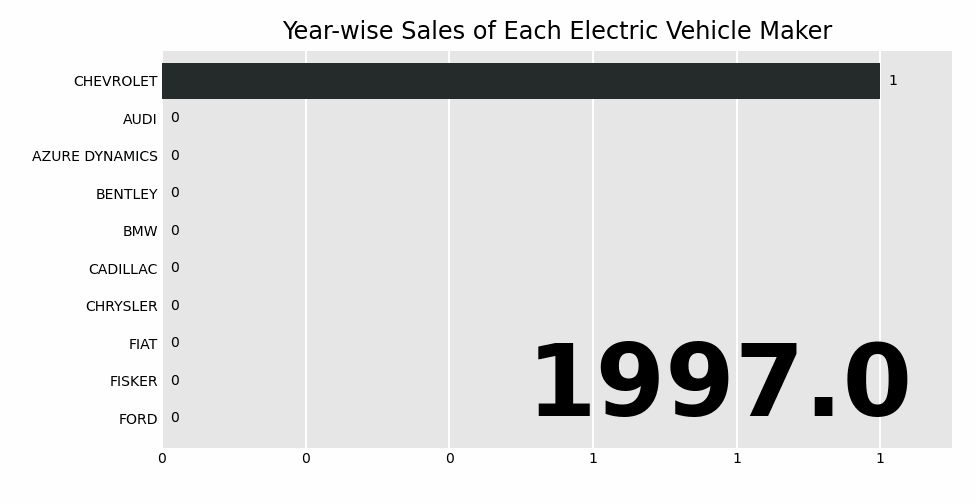

In [34]:
from IPython.display import Image
Image(filename='Ev_Racing_Bar_Plot.gif')